# Tutorial on CasADi and Opti
For more information on CasADi, check out https://web.casadi.org/docs/

For IPOPT options, check out https://coin-or.github.io/Ipopt/OPTIONS.html

In [1]:
from casadi import *
import matplotlib.pyplot as plt
from matplotlib.animation import *
from IPython.display import HTML

In [2]:
def plotObjective():
    plt.figure()

    delta = 0.025
    xx = np.arange(-1.7, 1.7, delta)
    yy = np.arange(-1.6, 1.6, delta)
    X, Y = np.meshgrid(xx, yy)
    Z = (1-X)**2 + (Y-X**2)**2
    plt.contour(X, Y, Z, levels=100)

    plt.gca().set_xlim([-1.7, 1.7])
    plt.gca().set_ylim([-1.5, 1.5])
    plt.gca().set_aspect('equal')

def createAnimation(opti_f):
    xx_sol = []
    yy_sol = []
    slopes = np.linspace(-2.0, 2.0, 30)
    for slope in slopes:
        x, y = opti_f(slope)
        xx_sol.append(x)
        yy_sol.append(y)
    
    plotObjective()
    plt.plot(np.cos(np.linspace(0, 2*np.pi, 100)), 
             np.sin(np.linspace(0, 2*np.pi, 100)), 'r', linewidth=4)
    constraint, = plt.plot(np.linspace(-2.0, 2.0, 2), slopes[0]*np.linspace(-2.0, 2.0, 2), "r", linewidth=4)
    solution, = plt.plot(xx_sol[0], yy_sol[0], marker='o', color='k', markersize=10)
    
    def update_frame(i):
        constraint.set_data(np.linspace(-2.0, 2.0, 2), slopes[i]*np.linspace(-2.0, 2.0, 2))
        solution.set_data([float(xx_sol[i])], [float(yy_sol[i])])
        return constraint, solution,
    
    animation1 = FuncAnimation(plt.gcf(), update_frame, frames=range(len(slopes)))
    
    HTML(animation1.to_jshtml())
    return animation1

## Basic CasADi introduction: variables and functions

In [7]:
x = MX.sym("x", 5, 1)
y = MX(2, 1)

y[0] = x[0] + x[1] + x[2]
y[1] = sumsqr(x[2:])

f = Function("f", [x], [y])
print(f([1, 2, 3, 4, 5]))
y = 0
print(f([1, 2, 3, 4, 5]))

[6, 50]
[6, 50]


## Using CasADi's Algorithmic differentation

In [9]:
J = Function("J", [x], [jacobian(f(x), x)])
print(J)
print(J([1,2,3,4,5]))

J:(i0[5])->(o0[2x5,6nz]) MXFunction

[[1, 1, 1, 00, 00], 
 [00, 00, 6, 8, 10]]


In [14]:
H = Function("H", [x], [hessian(transpose(f(x)) @ f(x), x)[0]])
print(H)
print(H([1,2,3,4,5]))

H:(i0[5])->(o0[5x5,17nz]) MXFunction

[[2, 2, 2, 00, 00], 
 [2, 2, 2, 00, 00], 
 [2, 2, 274, 96, 120], 
 [00, 00, 96, 328, 160], 
 [00, 00, 120, 160, 400]]


## Opti example
(see https://web.casadi.org/blog/opti/)

### Basic Rosenbrock example
\begin{align}
\min_{x,u} \quad (1-x)^2 + (y-x^2)^2
\end{align}


******************************************************************************
This program contains Ipopt, a library for large-scale nonlinear optimization.
 Ipopt is released as open source code under the Eclipse Public License (EPL).
         For more information visit https://github.com/coin-or/Ipopt
******************************************************************************

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:        3

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality c

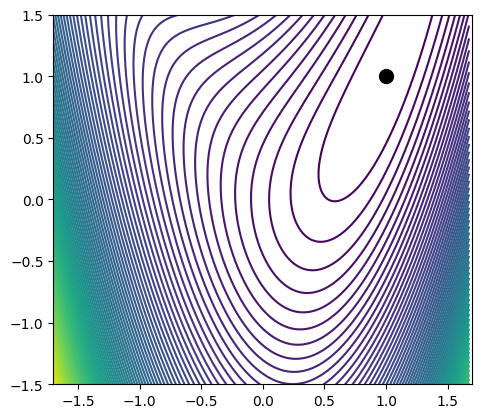

In [15]:
opti = Opti()

x = opti.variable(1,1)
y = opti.variable(1,1)

opti.minimize((1-x)**2 + (y-x**2)**2)

opti.solver("ipopt")
sol = opti.solve()

plotObjective()
plt.plot(sol.value(x), sol.value(y), 'k', marker='o', markersize=10)

### Let's add a simple constraint
\begin{align}
\min_{x,u} (1-x)^2 + (y-x^2)^2\\
\text{s.t.} \quad x^2 + y^2 = 1\quad 
\end{align}

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:        2
Number of nonzeros in inequality constraint Jacobian.:        0
Number of nonzeros in Lagrangian Hessian.............:        3

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:        1
Total number of inequality constraints...............:        0
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  1.0000000e+00 1.00e+00 2.00e+00  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

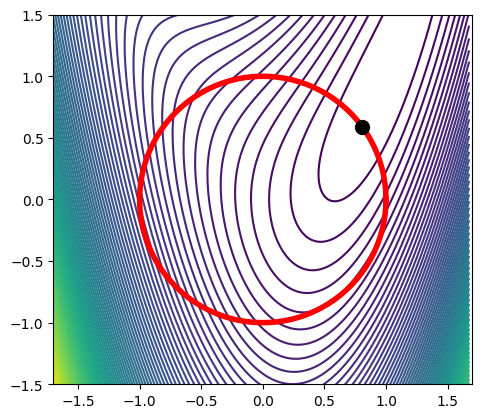

In [16]:
opti = Opti()

x = opti.variable(1,1)
y = opti.variable(1,1)

opti.minimize((1-x)**2 + (y-x**2)**2)

opti.subject_to(x**2 + y**2 == 1)

opti.solver("ipopt")
sol = opti.solve()

plotObjective()
plt.plot(np.cos(np.linspace(0, 2*np.pi, 100)), 
         np.sin(np.linspace(0, 2*np.pi, 100)), 'r', linewidth=4.0)
plt.plot(sol.value(x), sol.value(y), 'k', marker='o', markersize=10)

### Let's add an inequality constraint also
\begin{align}
\min_{x,u} (1-x)^2 + (y-x^2)^2\\
\text{s.t.} \quad x^2 + y^2 = 1\\
y >= px
\end{align}

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:        2
Number of nonzeros in inequality constraint Jacobian.:        2
Number of nonzeros in Lagrangian Hessian.............:        3

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:        1
Total number of inequality constraints...............:        1
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        1

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  1.0000000e+00 1.00e+00 2.00e+00  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

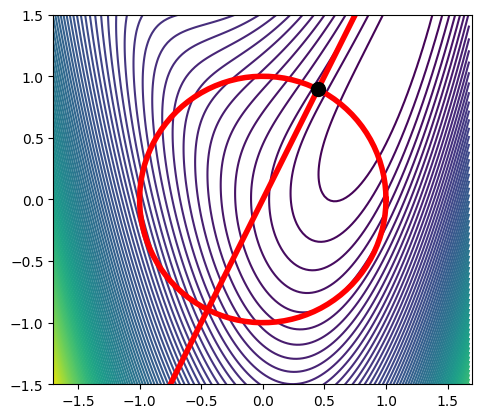

In [17]:
opti = Opti()

x = opti.variable(1,1)
y = opti.variable(1,1)
p = opti.parameter(1,1)

opti.minimize((1-x)**2 + (y-x**2)**2)

opti.subject_to(x**2 + y**2 == 1)
opti.subject_to(y >= p*x)

opti.set_value(p,2)
opti.solver("ipopt")
sol = opti.solve()

opti.solver("ipopt", {"print_time":False}, {"print_level":5, "max_iter":5})

opti.set_value(p, 2.0)

try:
    sol = opti.solve()
    
    plotObjective()
    plt.plot(np.cos(np.linspace(0, 2*np.pi, 100)), 
             np.sin(np.linspace(0, 2*np.pi, 100)), 'r', linewidth=4.0)
    plt.plot(np.linspace(-2.0, 2.0, 2), 2.0*np.linspace(-2.0, 2.0, 2), "r", linewidth=4)
    plt.plot(sol.value(x), sol.value(y), 'k', marker='o', markersize=10)

except:
    plotObjective()
    plt.plot(np.cos(np.linspace(0, 2*np.pi, 100)), 
             np.sin(np.linspace(0, 2*np.pi, 100)), 'r', linewidth=4.0)
    plt.plot(np.linspace(-2.0, 2.0, 2), 2.0*np.linspace(-2.0, 2.0, 2), "r", linewidth=4)
    plt.plot(opti.debug.value(x), opti.debug.value(y), 'k', marker='o', markersize=10)

### More advanced options in Opti

Callbacks

In [18]:
opti = Opti()

x = opti.variable(1,1)
y = opti.variable(1,1)
p = opti.parameter(1,1)

opti.minimize((1-x)**2 + (y-x**2)**2)

opti.subject_to(x**2 + y**2 == 1)
opti.subject_to(y >= p*x)

opti.solver("ipopt", {"print_time":False}, {"print_level":5, "max_iter":5})

opti.callback(lambda i : print(opti.debug.value(x), opti.debug.value(y)))

opti.set_value(p, 2.0)
sol = opti.solve()

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:        2
Number of nonzeros in inequality constraint Jacobian.:        2
Number of nonzeros in Lagrangian Hessian.............:        3

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:        1
Total number of inequality constraints...............:        1
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        1

0.0 0.0
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  1.0000000e+00 1.00e+00 2.00e+00  -1.0 0.00e+00    -  0.00e+00 0

RuntimeError: Error in Opti::solve [OptiNode] at .../casadi/core/optistack.cpp:157:
.../casadi/core/optistack_internal.cpp:998: Assertion "return_success(accept_limit)" failed:
Solver failed. You may use opti.debug.value to investigate the latest values of variables. return_status is 'Maximum_Iterations_Exceeded'

Create an opti.to_function object to play around with the parameter p

Optimal solution: (0.447214, 0.894427)


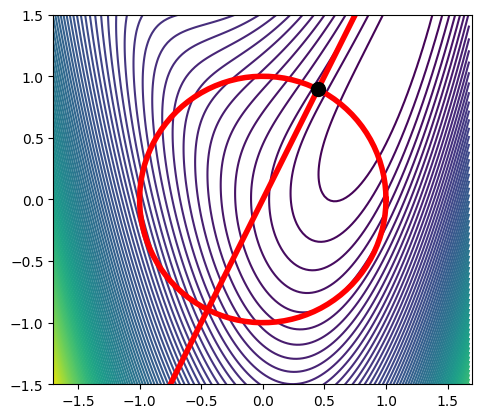

In [23]:
opti = Opti()

x = opti.variable(1,1)
y = opti.variable(1,1)
p = opti.parameter(1,1)

opti.minimize((1-x)**2 + (y-x**2)**2)

opti.subject_to(x**2 + y**2 == 1)
opti.subject_to(y >= p*x)

opti.solver("ipopt", {"print_time":False}, {"print_level":0, "max_iter":500})

opti.set_value(p, 2.0)

opti_f = opti.to_function("opti_f", [p], [x, y])
sol_x, sol_y = opti_f(2)

print(f"Optimal solution: ({sol_x}, {sol_y})")

plotObjective()
plt.plot(np.cos(np.linspace(0, 2*np.pi, 100)), 
         np.sin(np.linspace(0, 2*np.pi, 100)), 'r', linewidth=4.0)
plt.plot(np.linspace(-2.0, 2.0, 2), 2.0*np.linspace(-2.0, 2.0, 2), "r", linewidth=4)
plt.plot(sol_x, sol_y, 'k', marker='o', markersize=10)

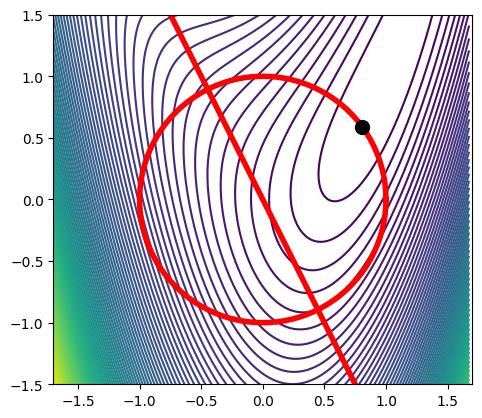

In [24]:
animation1 = createAnimation(opti_f)
HTML(animation1.to_jshtml())

Provide initial guess to prevent convergence to local minimum.

In [ ]:
opti = Opti()

x = opti.variable(1,1)
y = opti.variable(1,1)
p = opti.parameter(1,1)

opti.minimize((1-x)**2 + (y-x**2)**2)

opti.subject_to(x**2 + y**2 == 1)
opti.subject_to(y >= p*x)

opti.solver("ipopt", {"print_time":False}, {"print_level":0, "max_iter":500})

opti.set_value(p, 2.0)

opti.set_initial(x, 0.5)
opti.set_initial(y, 2.0)

opti_f = opti.to_function("opti_f", [p], [x, y])

animation2 = createAnimation(opti_f)
HTML(animation2.to_jshtml())